In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import seaborn as sns
import numpy as np
import branca.colormap as cm
import folium
from folium.plugins import HeatMap
from scipy.stats import norm
import scipy.stats as st
import plotly.offline as pyo
import plotly.graph_objs as go
from collections import Counter
from geopy.distance import geodesic
import time
import xgboost as xgb
from xgboost import plot_importance

In [2]:
berlin = pd.read_csv(r"C:\Users\Alper\Desktop\WorkStuff\Project\listings_berlin.csv")
berlin_detailed = pd.read_csv(r"C:\Users\Alper\Desktop\WorkStuff\project\listings_detailed.csv")

inst_book = berlin_detailed['instant_bookable']
host_verify = berlin_detailed['host_identity_verified']
berlin = berlin.join(inst_book)
berlin = berlin.join(host_verify)

In [3]:
# Let's check the entire dataset to see how much data we have.
berlin.shape

(16680, 20)

In [4]:
# We found out that we have 16680 listings with 18 columns.
# Next we check the data types in the dataset.
berlin.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                            object
instant_bookable                   object
host_identity_verified             object
dtype: object

In [5]:
berlin

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,instant_bookable,host_identity_verified
0,652868795892201022,Kleine Auszeit? Oder Business-Trip? Alles mögl...,21708794,Familie Sek,Tempelhof - Schöneberg,Lichtenrade,52.357652,13.399098,Entire home/apt,88,1,0,NaN,NaN,1,6,0,NaN,t,t
1,27080612,Apartment with Living/Sleeping Room & own Kitchen,130216168,Tommy,Marzahn - Hellersdorf,Mahlsdorf,52.520060,13.659560,Entire home/apt,60,2,126,2022-09-11,2.54,2,163,18,NaN,f,t
2,29077694,Wohnung im Grünen nah an der Metropole,219116245,Tilmann,Steglitz - Zehlendorf,Zehlendorf Südwest,52.412320,13.207150,Entire home/apt,36,8,29,2022-05-29,0.63,1,6,6,NaN,t,t
3,665648367391379321,Schöne Eigentumswohnung mit Balkon,106965422,Paul,Steglitz - Zehlendorf,Drakestr.,52.402144,13.273865,Entire home/apt,120,1,0,NaN,NaN,1,257,0,"Available with a mobility lease only (""bail mo...",f,t
4,37738004,Remise Villa Erica Superior Apartment,42048631,Archibald,Steglitz - Zehlendorf,Drakestr.,52.410150,13.292070,Entire home/apt,110,5,1,2019-10-26,0.03,8,160,0,NaN,f,t
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16675,2650812,Gäste-Zimmer ALEXA 2,13569320,Karl,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.457760,13.725400,Private room,99,1,0,NaN,NaN,4,351,0,NaN,f,t
16676,39853201,"3-Zi-Wohnung am Dämeritzsee, Berlin, Brandenburg",89818386,Hanne,Treptow - Köpenick,Müggelheim,52.418070,13.741730,Entire home/apt,160,4,23,2022-08-11,0.87,1,148,12,NaN,f,t
16677,2855881,Gäste-Zimmer ALEXA 4,13569320,Karl,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.459650,13.725480,Private room,195,1,0,NaN,NaN,4,336,0,NaN,f,t
16678,46313178,TESLA / Grünheide Wohnung hochwertig möbliert,87267772,Florian,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.460610,13.699170,Entire home/apt,60,90,0,NaN,NaN,1,288,0,NaN,t,t


In [6]:
# We drop columns like "license", "host_name", "id", "last_review" because 
# those datas are irrelevant or unethical for our analysis.
# License column is full of NaN values.
berlin.drop(['id','host_name','last_review', 'license'],axis=1,inplace=True)

In [7]:
berlin.isnull().sum()

name                                20
host_id                              0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
reviews_per_month                 2868
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
instant_bookable                     0
host_identity_verified              16
dtype: int64

In [8]:
# From the above output, we see that some columns have huge amount of NaN values.
# Next, we need to replace all the missing values with 0 (zero)
# to make sure the missing values do not interfere with our analysis.
berlin.fillna(0,inplace=True)

In [9]:
# We check again for the NaN values
berlin.isnull().sum()

name                              0
host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
instant_bookable                  0
host_identity_verified            0
dtype: int64

In [10]:
berlin

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,instant_bookable,host_identity_verified
0,Kleine Auszeit? Oder Business-Trip? Alles mögl...,21708794,Tempelhof - Schöneberg,Lichtenrade,52.357652,13.399098,Entire home/apt,88,1,0,0.00,1,6,0,t,t
1,Apartment with Living/Sleeping Room & own Kitchen,130216168,Marzahn - Hellersdorf,Mahlsdorf,52.520060,13.659560,Entire home/apt,60,2,126,2.54,2,163,18,f,t
2,Wohnung im Grünen nah an der Metropole,219116245,Steglitz - Zehlendorf,Zehlendorf Südwest,52.412320,13.207150,Entire home/apt,36,8,29,0.63,1,6,6,t,t
3,Schöne Eigentumswohnung mit Balkon,106965422,Steglitz - Zehlendorf,Drakestr.,52.402144,13.273865,Entire home/apt,120,1,0,0.00,1,257,0,f,t
4,Remise Villa Erica Superior Apartment,42048631,Steglitz - Zehlendorf,Drakestr.,52.410150,13.292070,Entire home/apt,110,5,1,0.03,8,160,0,f,t
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16675,Gäste-Zimmer ALEXA 2,13569320,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.457760,13.725400,Private room,99,1,0,0.00,4,351,0,f,t
16676,"3-Zi-Wohnung am Dämeritzsee, Berlin, Brandenburg",89818386,Treptow - Köpenick,Müggelheim,52.418070,13.741730,Entire home/apt,160,4,23,0.87,1,148,12,f,t
16677,Gäste-Zimmer ALEXA 4,13569320,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.459650,13.725480,Private room,195,1,0,0.00,4,336,0,f,t
16678,TESLA / Grünheide Wohnung hochwertig möbliert,87267772,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.460610,13.699170,Entire home/apt,60,90,0,0.00,1,288,0,t,t


In [11]:
# Next, let's check the unique neighbourhood groups(a.k.a. regions)
berlin['neighbourhood_group'].unique()

array(['Tempelhof - Schöneberg', 'Marzahn - Hellersdorf',
       'Steglitz - Zehlendorf', 'Pankow', 'Treptow - Köpenick',
       'Charlottenburg-Wilm.', 'Friedrichshain-Kreuzberg', 'Neukölln',
       'Mitte', 'Lichtenberg', 'Spandau', 'Reinickendorf'], dtype=object)

In [12]:
#From the above output, we see that there are 12 unique neighbourhood groups(a.k.a. regions)
# Let's check the unique neighbourhoods next.
berlin['neighbourhood'].unique()

array(['Lichtenrade', 'Mahlsdorf', 'Zehlendorf  Südwest', 'Drakestr.',
       'Prenzlauer Berg Südwest', 'Rahnsdorf/Hessenwinkel',
       'Schöneberg-Nord', 'Helmholtzplatz', 'Pankow Zentrum',
       'Prenzlauer Berg Nordwest', 'Neue Kantstraße',
       'Tempelhofer Vorstadt', 'nördliche Luisenstadt', 'Reuterstraße',
       'Brunnenstr. Süd', 'Zehlendorf  Nord', 'Prenzlauer Berg Ost',
       'Buckow Nord', 'Alexanderplatz', 'Düsseldorfer Straße',
       'Pankow Süd', 'Regierungsviertel', 'Halensee', 'Karlshorst',
       'Karl-Marx-Allee-Nord', 'Prenzlauer Berg Süd',
       'Frankfurter Allee Süd FK', 'Südliche Friedrichstadt',
       'Alt  Treptow', 'Rudow', 'Mierendorffplatz', 'Moabit West',
       'Brunnenstr. Nord', 'Prenzlauer Berg Nord', 'Otto-Suhr-Allee',
       'Tiergarten Süd', 'Kantstraße', 'Wedding Zentrum', 'Schmargendorf',
       'Karl-Marx-Allee-Süd', 'Altglienicke', 'Moabit Ost',
       'südliche Luisenstadt', 'Blankenfelde/Niederschönhausen',
       'Rixdorf', 'Schillerp

In [13]:
# From the above output, we see that there are a lot of neighbourhoods in Berlin.
# Next, let's check the room types.
berlin['room_type'].unique()

array(['Entire home/apt', 'Private room', 'Shared room', 'Hotel room'],
      dtype=object)

In [14]:
# We see that there are 4 different room types, Entire home/apt, Private room, Shared room, Hotel room.

In [15]:
# First, let's fetch the top 10 hosts and visualize their listing count.
top_host_id = berlin['host_id'].value_counts().head(10)

[Text(0, 0, '434485440'),
 Text(1, 0, '335573202'),
 Text(2, 0, '8250486'),
 Text(3, 0, '210700814'),
 Text(4, 0, '454962512'),
 Text(5, 0, '378071271'),
 Text(6, 0, '8912086'),
 Text(7, 0, '39450649'),
 Text(8, 0, '3003519'),
 Text(9, 0, '177712632')]

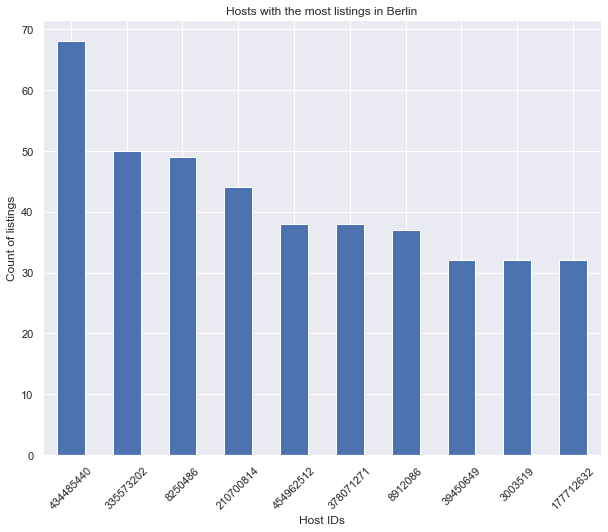

In [16]:
# Next, we visualize it via boxplot.
sns.set(rc={'figure.figsize':(10,8)})
viz_bar = top_host_id.plot(kind='bar')
viz_bar.set_title('Hosts with the most listings in Berlin')
viz_bar.set_xlabel('Host IDs')
viz_bar.set_ylabel('Count of listings')
viz_bar.set_xticklabels(viz_bar.get_xticklabels(), rotation=45)

In [17]:
# From the chart above, we can see the total of top 10 hosts
# is only 2,67% ( 445 listings ) of the whole dataset (16680 listings). 
#Host with ID 434485440 has the most listings between top 10 hosts with 68 listings.

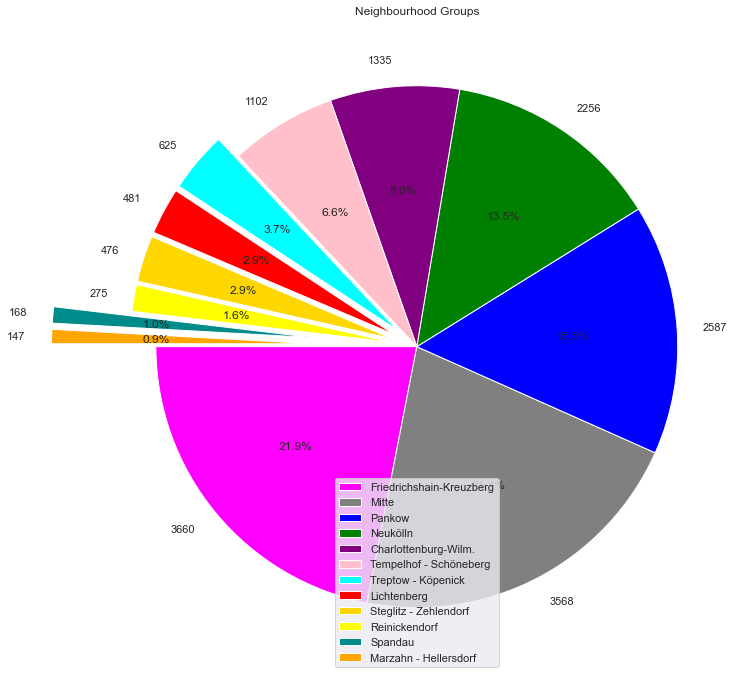

In [18]:
# Next, we visualize the proportion of the listing count
# on each region area using the ‘neighbourhood_group’ columns

labels = berlin.neighbourhood_group.value_counts().index
colors = ['magenta','gray','blue','green','purple','pink','cyan','red','gold', 'yellow', 'darkcyan', 'orange']
explode = (0,0,0,0,0,0,0.1,0.1,0.1,0.1,0.4,0.4)
shape = berlin.neighbourhood_group.value_counts().values
plt.figure(figsize=(12,12))
plt.pie(shape,explode = explode, labels=shape, colors= colors, autopct = '%1.1f%%', startangle=180)
plt.legend(labels=labels,loc="lower center" )
plt.title('Neighbourhood Groups',loc='center')
plt.savefig("nbhd_groups_listings.png")
plt.show()

In [19]:
# From the chart above, we see the Friedrichshain-Kreuzberg Region has the most listings with 3660 listings number,
# covering 21.9% of the total listings.
# Marzahn-Hellersdorf and Spandau Regions have the least amount of listings with 0.9%(147) and 1.0%(168), respectfully.

In [20]:
# Next, we look up the top 10 neighbourhood areas that have the highest number of listings
berlin.neighbourhood.value_counts().head(10)

Alexanderplatz              937
Frankfurter Allee Süd FK    906
Tempelhofer Vorstadt        813
Reuterstraße                651
Brunnenstr. Süd             635
Rixdorf                     515
Neuköllner Mitte/Zentrum    491
südliche Luisenstadt        473
Prenzlauer Berg Südwest     427
Schillerpromenade           424
Name: neighbourhood, dtype: int64

In [21]:
# As we can see, Alexanderplatz has the highest number of listings with 937 listings.
#To create a map of the listing location, we will use the ‘longitude’ and ‘latitude’ column. 
# But first, we need to check the values within the column.

coordinates = berlin.loc[:,['longitude','latitude']]
coordinates.describe()

,longitude,latitude
count,16680.000000,16680.000000
mean,13.404151,52.509265
std,0.071314,0.036103
min,13.072850,52.332300
25%,13.365737,52.489050
50%,13.414495,52.509575
75%,13.439420,52.532913
max,13.769390,52.673960


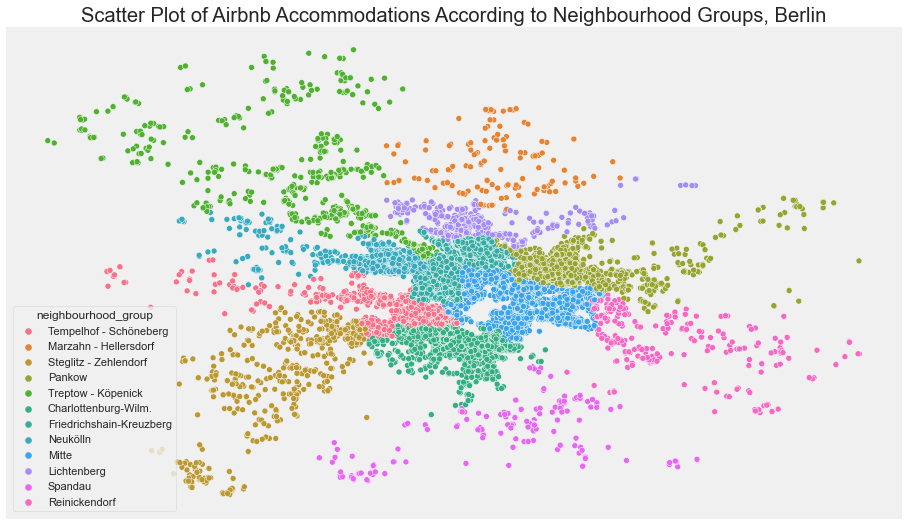

In [22]:
fig = plt.figure(figsize=(16,9))
plt.style.use('fivethirtyeight')
sns.scatterplot(x = 'latitude', y = 'longitude', data = berlin, hue = 'neighbourhood_group')
plt.xlabel('')
plt.xticks([])
plt.ylabel('')
plt.yticks([])
plt.title('Scatter Plot of Airbnb Accommodations According to Neighbourhood Groups, Berlin')
plt.savefig("Scatter_plot_map.png")
plt.show()

In [23]:
# Now we can see how the listings are plotted into a map. 
# For a better understanding of the listings density, we can use the folium heat map


map_folium = folium.Map([52.509265,13.404151],zoom_start=11.4)
HeatMap(berlin[['latitude','longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(map_folium)
display(map_folium)

In [24]:
# From the map above, we can see clearly that density of the listings are almost equally distributed,
# shown by the redish color in the heat map.
# The listing density increasingly declining the more it’s farther away from the center of the city,
# with some exceptions at certain areas.

In [25]:
# To get rid of some extra outliers, we get rid of price values which above 300
berlin_1 = berlin[(berlin.price <= 300) & (berlin.price >=1)]

In [26]:
# To have some knowledge about the distribution of prices around the city,
# we can create a color map.
colormap = cm.LinearColormap(colors=['green', 'yellow', 'red'], vmin=berlin_1.price.min(), vmax=berlin_1.price.max())

m = folium.Map(location=[52.509265,13.404151] , zoom_start=11.4)

# go through each rentals in set, make circle, and add to map.
for i in range(len(berlin_1)):
    folium.Circle(
        location=[berlin_1.iloc[i]['latitude'], berlin_1.iloc[i]['longitude']],
        radius=10, color=colormap(berlin_1.iloc[i]['price'])).add_to(m)

m.add_child(colormap)
display(m)

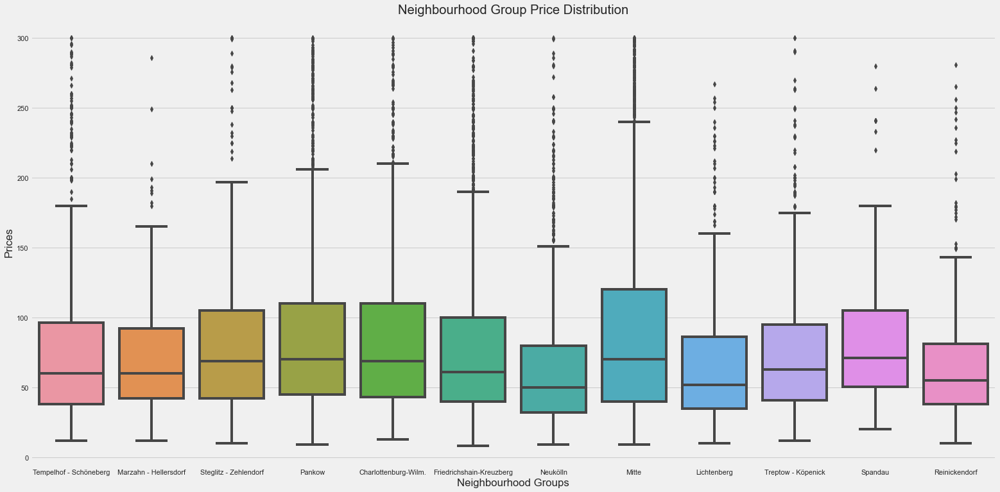

In [27]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(24,12))
sns.boxplot(y='price',x='neighbourhood_group',data = berlin_1)
plt.title('Neighbourhood Group Price Distribution')
plt.xlabel('Neighbourhood Groups')
plt.ylabel('Prices')
plt.savefig("nbhd_groups_price_distribution.png")
plt.show()

In [28]:
# As we can see, we still have some outliers.
# But the amount is less than before.
# At the same time, we can observe that Mitte region has the highest price
# and highest Q3 value with a median around €70.

In [29]:
#Next, we will explore deeper on the property detail by finding out what the most used word in the listing name.
#The most used word could represent the selling value of their property for the prospective guests.
#First, we will create a function to collect the words.
names=[]
for name in berlin.name:
    names.append(name)
def split_name(name):
    s = str(name).split()
    return s
names_count = []
for n in names:
    for word in split_name(n):
        word = word.lower()
        names_count.append(word)

In [30]:
top_25 = Counter(names_count).most_common()
top_25 = top_25[:25]

[Text(0, 0, 'in'),
 Text(1, 0, 'room'),
 Text(2, 0, 'apartment'),
 Text(3, 0, 'berlin'),
 Text(4, 0, 'the'),
 Text(5, 0, 'of'),
 Text(6, 0, 'flat'),
 Text(7, 0, 'cozy'),
 Text(8, 0, 'with'),
 Text(9, 0, 'and'),
 Text(10, 0, '-'),
 Text(11, 0, 'zimmer'),
 Text(12, 0, 'cosy'),
 Text(13, 0, 'heart'),
 Text(14, 0, 'kreuzberg'),
 Text(15, 0, 'central'),
 Text(16, 0, 'neukölln'),
 Text(17, 0, 'wohnung'),
 Text(18, 0, 'mit'),
 Text(19, 0, 'im'),
 Text(20, 0, 'bright'),
 Text(21, 0, 'beautiful'),
 Text(22, 0, '2'),
 Text(23, 0, '&'),
 Text(24, 0, 'studio')]

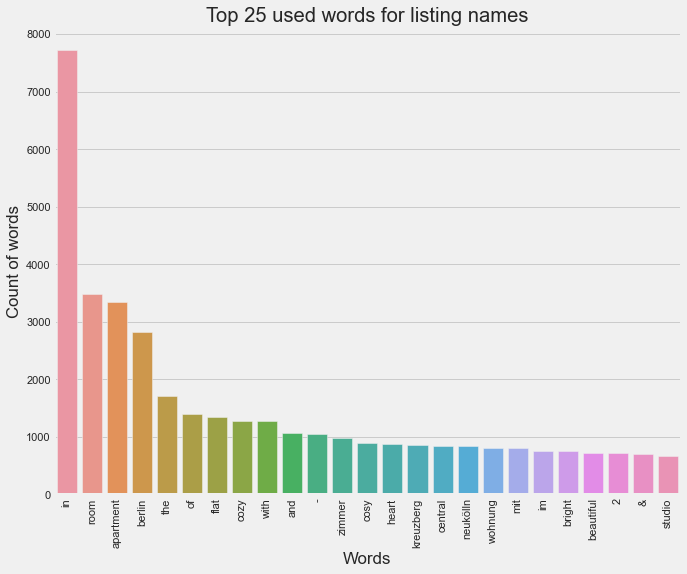

In [31]:
word_count_data = pd.DataFrame(top_25)
word_count_data.rename(columns={0:'Words',1:'Counts'},inplace=True)
viz_count = sns.barplot(x='Words',y='Counts', data = word_count_data)
viz_count.set_title('Top 25 used words for listing names')
viz_count.set_ylabel('Count of words')
viz_count.set_xlabel('Words')
viz_count.set_xticklabels(viz_count.get_xticklabels(),rotation = 90)

In [32]:
# From the chart above, we see the top 25 words used in the listing name.

In [33]:
# We will find out the top 10 listings based on
# their number of reviews to know the most popular Airbnb listings in Berlin.
top10_listings = berlin.nlargest(10, 'number_of_reviews')
top10_listings

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,instant_bookable,host_identity_verified
10109,"Nena Apartments Metropolpark ""Studio""",258761653,Mitte,Alexanderplatz,52.51253,13.41286,Entire home/apt,219,2,1483,36.44,2,122,925,f,t
13612,numa | Modern Room with Digital Check-In,290026890,Tempelhof - Schöneberg,Schöneberg-Nord,52.50020,13.35273,Entire home/apt,231,1,1362,81.39,8,321,961,t,t
13850,"Nena Apartments Moritzplatz ""Studio""",401986350,Friedrichshain-Kreuzberg,Südliche Friedrichstadt,52.50173,13.41092,Entire home/apt,220,1,820,50.93,2,94,630,t,t
12690,"Nena Apartments Kreuzberg 61 ""Studio""",345525433,Friedrichshain-Kreuzberg,Tempelhofer Vorstadt,52.49638,13.39527,Entire home/apt,198,2,768,32.18,4,116,650,f,t
8692,Serviced Apartment - Studio in Prenzlauer Berg,148054076,Pankow,Prenzlauer Berg Ost,52.52935,13.45589,Hotel room,188,7,756,16.30,2,351,103,f,t
198,Lounge Room – Alex in 5 Min,286494,Pankow,Prenzlauer Berg Südwest,52.53091,13.41711,Private room,47,1,703,5.58,5,289,70,f,t
250,Cloud room in Berlin's center - zero waste living,2547002,Pankow,Prenzlauer Berg Südwest,52.53097,13.41577,Private room,45,1,700,5.61,1,267,92,f,t
323,Berlin Room Oriental Style P'Berg,286494,Pankow,Prenzlauer Berg Südwest,52.53103,13.41687,Private room,42,1,652,5.32,5,303,66,f,t
167,"Central, cosy and one-of-a-kind",1250154,Pankow,Prenzlauer Berg Südwest,52.53237,13.41548,Entire home/apt,80,3,627,4.92,2,8,60,t,t
13141,numa | Studio-Apartment in Berlin Mitte,367824579,Mitte,Alexanderplatz,52.52391,13.39975,Entire home/apt,252,1,621,26.69,5,324,177,t,t


In [34]:
# We found out that "Nena Apartments Metropolpark "Studio"" has the highest number of reviews with 1483.
# And we also discovered that the majority of the most reviewed listings
# are located in the Pankow Neighbourhood, with 4 out of 10 listings.

In [35]:
average_price = top10_listings.price.mean()
print('Average price per night: € {}'.format(average_price))

Average price per night: € 152.2


In [36]:
# We found out that average price between top 10 listings is €152.20
# Also 6 of them are "Entire home/apt" room type.
# The most popular listing is also one of the most expensive listings with price €219.
# This makes sense since it's a "Entire home/apt" room type rather than Private Room.

In [37]:
# STATISTICAL ANALYSIS PART
# Let’s find the mean, median and mode of the prices of the listings. 
# Since we want it to make some sense, we'll use the set where we removed some outliers.
# (Price<300)

In [38]:
a = berlin_1['price'].mean()
b = berlin_1['price'].median()
c = float(berlin_1['price'].mode())
print(a)
print(b)
print(c)

80.33897247019165
63.0
50.0


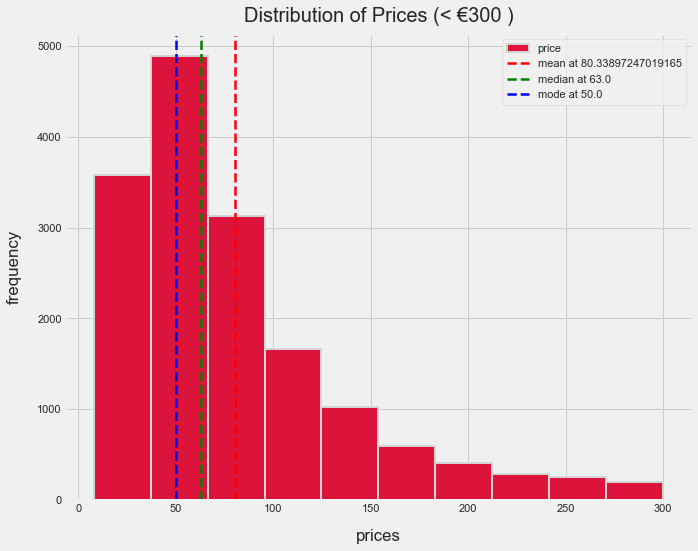

In [39]:
# Let's visualize the mean,median and mode of the "price" column in a graph.
# (Prices are <300 so that the graph will make sense)
berlin_1['price'].plot(kind='hist', figsize=(10,8), linewidth=2, color='crimson',
                    edgecolor='lightgray')
plt.xlabel('prices', labelpad=15)
plt.ylabel('frequency', labelpad=15)
plt.title("Distribution of Prices (< €300 )", y=1.012, fontsize=20)
measurements = [a,b,c]
names = ['mean','median','mode']
colors = ['red','green','blue']
for measurement, name, color in zip(measurements,names,colors):
    plt.axvline(x=measurement, linestyle='--',
                linewidth=2.5, label='{0} at {1}'.format(name,measurement), c=color)
plt.savefig("prices_hist.png")
plt.legend();

In [40]:
# From the look of our graph, we can say that it's a right skewed (positive skewness) graph.

In [41]:
# We can also investigate the standard deviation of the price column.
print(berlin_1['price'].std())

57.33522448944231


In [42]:
# As we can see the standard deviation of prices is 57 and it's huge.
# Let's investigate the mean, median and mode of "reviews_per_month" column.
print(berlin['reviews_per_month'].mean())
print(berlin['reviews_per_month'].median())
print(float(berlin['reviews_per_month'].mode()))

0.7129088729016839
0.17
0.0


In [43]:
# Values might be confusing because there are a lot of listings that has 0 reviews per month.
# To make more sense of values, we can drop the 0 values and check them again.
temp = berlin[(berlin['reviews_per_month'] > 0)]
print(temp['reviews_per_month'].mean())
print(temp['reviews_per_month'].median())
print(float(temp['reviews_per_month'].mode()))

0.8609412105415644
0.28
0.03


In [44]:
# As we can see, If we temporarily remove the 0 values in "reviews_per_month" column,
# Mean has changed to 0.86
# Median has changed to 0.28
# Mode has changed to 0.03

In [45]:
# We can do the same with the "number_of_reviews" column.
temp2 = berlin[(berlin['number_of_reviews'] > 0)]
print(temp2['number_of_reviews'].mean())
print(temp2['number_of_reviews'].median())
print(float(temp2['number_of_reviews'].mode()))

33.53373877787431
9.0
1.0


In [46]:
# As we can see above,
# Mean of number of reviews is 33.5
# Median is 9
# Mode is 1

In [47]:
# We can specify the room types and examine data like that.
berlin_apt = berlin_1[(berlin_1['room_type'] == 'Entire home/apt')]

In [48]:
# We can calculate the mean, median and mode values from the prices of the data we have separated according to the room type 'entire home/apt' .
x = berlin_apt['price'].mean()
y = berlin_apt['price'].median()
z = float(berlin_apt['price'].mode())
print(x)
print(y)
print(z)

100.11925439525524
83.0
50.0


In [49]:
# Results showing above as 
# Mean of the prices of 'Entire home/apt'is 100.11
# Median is 83
# Mode is 50

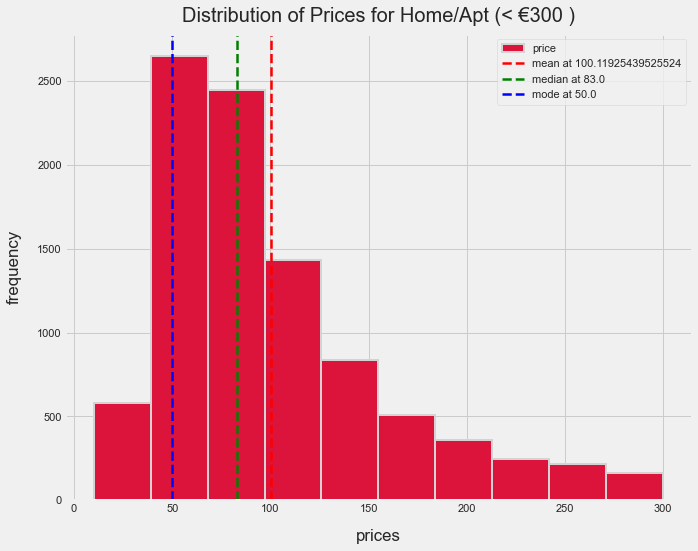

In [50]:
# Let's visualize the mean,median and mode of the "price" for 'Entire home/apt' in a graph.
# (Prices are <300 so that the graph will make sense)
berlin_apt['price'].plot(kind='hist', figsize=(10,8), linewidth=2, color='crimson',
                    edgecolor='lightgray')
plt.xlabel('prices', labelpad=15)
plt.ylabel('frequency', labelpad=15)
plt.title("Distribution of Prices for Home/Apt (< €300 )", y=1.012, fontsize=20)
measurements = [x,y,z]
names = ['mean','median','mode']
colors = ['red','green','blue']
for measurement, name, color in zip(measurements,names,colors):
    plt.axvline(x=measurement, linestyle='--',
                linewidth=2.5, label='{0} at {1}'.format(name,measurement), c=color)
plt.savefig("home_apt_prices.png")
plt.legend();

In [51]:
# From the look of our graph, we can say that it's a right skewed (positive skewness) graph.
# But when price is less then 50 frequency very low and this disrupts the flow of the graph.

In [52]:
# Lets look at the standart deviation for home/apt price.
print(berlin_apt['price'].std())

58.48146493799067


In [53]:
# Standart deviation for home/apt price is 58.4

In [54]:
# Since we have 4 room type, we can implement the same operations for every each of them.
berlin_shared = berlin_1[(berlin_1['room_type'] == 'Shared room')]

In [55]:
e = berlin_shared['price'].mean()
d = berlin_shared['price'].median()
f = float(berlin_shared['price'].mode())
print(e)
print(d)
print(f)

58.57837837837838
45.0
15.0


In [56]:
# This time shared room results are smaller numbers than entire home as we can expect.
# Mean is 58.57
# Median is 45
# Mode is 15  

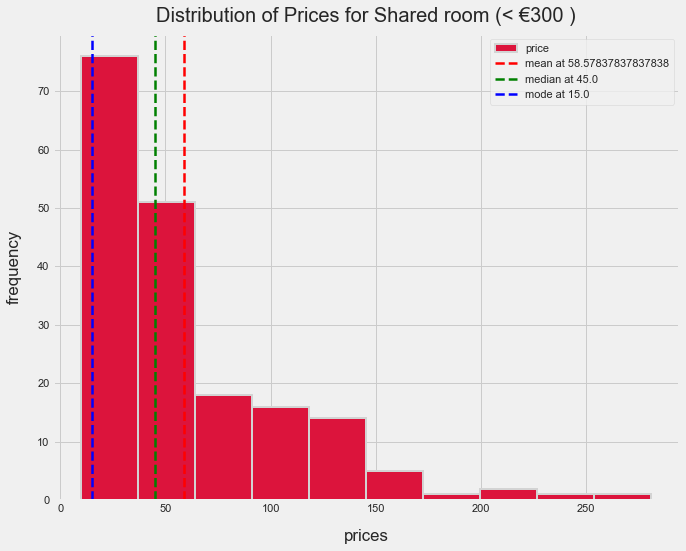

In [57]:
# Let's visualize the mean,median and mode of the "price" for shared room in a graph.
# (Prices are <300 so that the graph will make sense)
berlin_shared['price'].plot(kind='hist', figsize=(10,8), linewidth=2, color='crimson',
                    edgecolor='lightgray')
plt.xlabel('prices', labelpad=15)
plt.ylabel('frequency', labelpad=15)
plt.title("Distribution of Prices for Shared room (< €300 )", y=1.012, fontsize=20)
measurements = [e,d,f]
names = ['mean','median','mode']
colors = ['red','green','blue']
for measurement, name, color in zip(measurements,names,colors):
    plt.axvline(x=measurement, linestyle='--',
                linewidth=2.5, label='{0} at {1}'.format(name,measurement), c=color)
plt.savefig("shared_prices.png")
plt.legend();

In [58]:
# From the look of our graph, we can say that it's a right skewed (positive skewness) graph.
# We can easily say from the graph that prices more than 150 is not preferred.

In [59]:
print(berlin_shared['price'].std())

46.83580903780372


In [60]:
# For shared room price the standart deviation is 46.8 and its less than home/apt price.

In [61]:
# Keep analysing the different room types.
berlin_prv = berlin_1[(berlin_1['room_type'] == 'Private room')]

In [62]:
g = berlin_prv['price'].mean()
h = berlin_prv['price'].median()
j = float(berlin_prv['price'].mode())
print(g)
print(h)
print(j)

50.26813082635488
39.0
30.0


In [63]:
# Results are kinda between the ones for entire room and shared room.
# Mean is 50.26 
# Median is 39
# Mode is 30

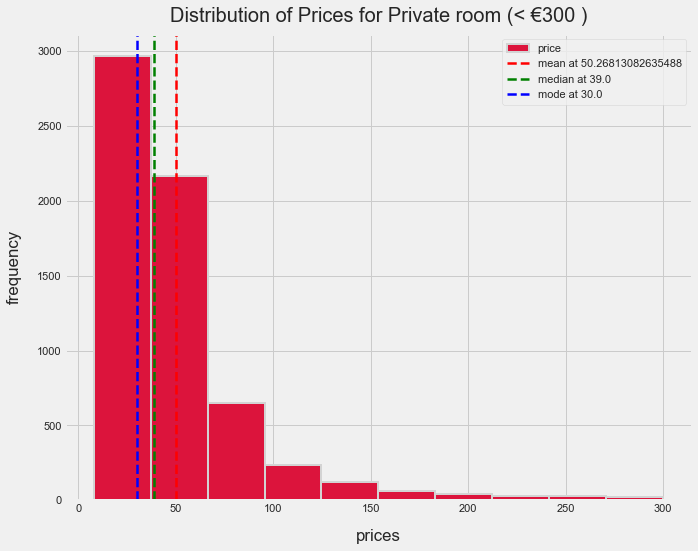

In [64]:
# Let's visualize the mean,median and mode of the "price" column in a graph.
# (Prices are <300 so that the graph will make sense)
berlin_prv['price'].plot(kind='hist', figsize=(10,8), linewidth=2, color='crimson',
                    edgecolor='lightgray')
plt.xlabel('prices', labelpad=15)
plt.ylabel('frequency', labelpad=15)
plt.title("Distribution of Prices for Private room (< €300 )", y=1.012, fontsize=20)
measurements = [g,h,j]
names = ['mean','median','mode']
colors = ['red','green','blue']
for measurement, name, color in zip(measurements,names,colors):
    plt.axvline(x=measurement, linestyle='--',
                linewidth=2.5, label='{0} at {1}'.format(name,measurement), c=color)
plt.savefig("private_prices.png")
plt.legend();

In [65]:
# From the look of our graph, we can say that it's a right skewed (positive skewness) graph.
# Graph kinda similar to shared room.

In [66]:
print(berlin_prv['price'].std())

38.243080197524094


In [67]:
# The smallest standart deviation is private room price and its 38.2 .

In [68]:
# Last room type that we gonna invest is hotel room.
berlin_hotel = berlin_1[(berlin_1['room_type'] == 'Hotel room')]

In [69]:
n = 195
l = berlin_hotel['price'].mean()
m = berlin_hotel['price'].median()
print(l)
print(m)
print(n)

200.63492063492063
207.0
195


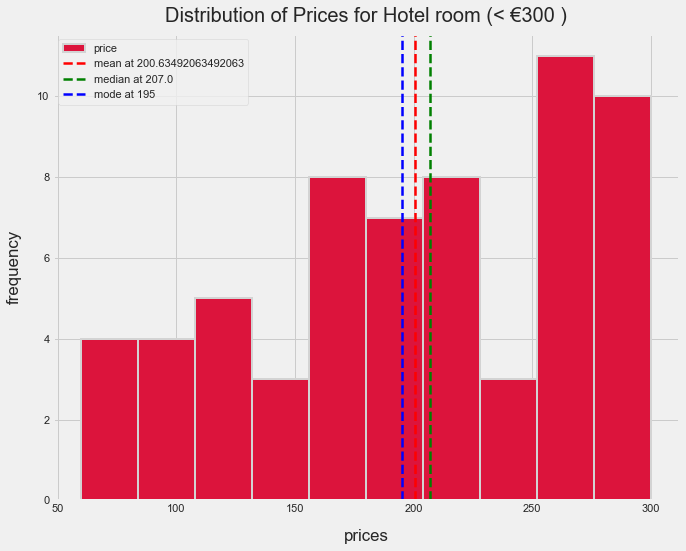

In [70]:
# Let's visualize the mean,median and mode of the "price" column in a graph.
# (Prices are <300 so that the graph will make sense)
berlin_hotel['price'].plot(kind='hist', figsize=(10,8), linewidth=2, color='crimson',
                    edgecolor='lightgray')
plt.xlabel('prices', labelpad=15)
plt.ylabel('frequency', labelpad=15)
plt.title("Distribution of Prices for Hotel room (< €300 )", y=1.012, fontsize=20)
measurements = [l,m,n]
names = ['mean','median','mode']
colors = ['red','green','blue']
for measurement, name, color in zip(measurements,names,colors):
    plt.axvline(x=measurement, linestyle='--',
                linewidth=2.5, label='{0} at {1}'.format(name,measurement), c=color)
plt.savefig("hotel_prices.png")
plt.legend();

In [71]:
# For diversity, we continue to analyze the dataset from different perspectives.
# This time, we seperate the data as minimum nights less or equal than 5 to see the prices for the min residence times.
# And we can do this for each room type.
berlin_min = berlin[(berlin.minimum_nights <= 5) & (berlin.room_type == 'Entire home/apt')]

In [72]:
# Also, we can calculate the mean of these prices.
min = berlin_min['price'].mean()
print(min)

127.6032423208191


In [73]:
# The mean of Home/apt prices for 5 days or less is 127.60

In [74]:
# For long-term stays, we limit the data to 30 days or more with same room type.
berlin_min30 = berlin[(berlin.minimum_nights >= 30) & (berlin.room_type == 'Entire home/apt')]

In [75]:
min30 = berlin_min30['price'].mean()
print(min30)

90.02890625


In [76]:
# The mean of Home/apt prices for 30 days or more is 90 and its surprisingly less than before.
# So we can say that in long-term renting prices are more cheaper.

In [77]:
# Lets move on with hotel rooms.
berlin_min_hotel = berlin[(berlin.minimum_nights <= 5) & (berlin.room_type == 'Hotel room')]

In [78]:
min_hotel= berlin_min_hotel['price'].mean()
print(min_hotel)

331.3587786259542


In [79]:
# For hotel room mean of the price for 5 days or less so much higher than home and its 331.35 .

In [80]:
# This time we looking for more than 30 days for hotel room.
min30_hotel = berlin[(berlin.minimum_nights >= 30) & (berlin.room_type == 'Hotel room')]
min30_hotel

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,instant_bookable,host_identity_verified


In [81]:
# Apparently, there is no hotel room for more than 30 days in our dataset.

In [82]:
# Let's keep going with private room.
berlin_min_priv = berlin[(berlin.minimum_nights <= 5) & (berlin.room_type == 'Private room')]

In [83]:
min_p= berlin_min_priv['price'].mean()
print(min_p)

60.6000366770585


In [84]:
# We can see that for private room for 5days or less is cheapest among others.
# Mean is 60.6

In [85]:
berlin_min_priv30 = berlin[(berlin.minimum_nights >= 30) & (berlin.room_type == 'Private room')]

In [86]:
min_priv30= berlin_min_priv30['price'].mean()
print(min_priv30)

53.65217391304348


In [87]:
# Mean of the price for private room for 30 days or more is even more cheaper and its 53.6 .

In [88]:
# Last type is shared room.
berlin_min_shared = berlin[(berlin.minimum_nights <= 5) & (berlin.room_type == 'Shared room')]

In [89]:
min_s= berlin_min_shared['price'].mean()
print(min_s)

78.45029239766082


In [90]:
# Mean of the shared room price for 5 days and less is 78.

In [91]:
berlin_min_s30 = berlin[(berlin.minimum_nights >= 30) & (berlin.room_type == 'Shared room')]

In [92]:
min_s30= berlin_min_s30['price'].mean()
print(min_s30)

66.18181818181819


In [93]:
# For more than 30 days result is kinda close to private room and mean is 66.18 .

In [94]:
# Sampling Methods
# In this step, we will perform some sampling methods and decide which one represents the data best.
# To test which one fits better, we take the mean of the price of all dataset first.
# Then we take the mean of price again in different samples. 

In [95]:
print(berlin_1['price'].mean())

80.33897247019165


In [96]:
# As we can see, mean of the price for our dataset is 80.3

In [97]:
# There are several sampling methods. 
# One of the easier ways to take samples is Random Sampling method.
# Simple random  sampling
from random import sample

In [98]:
# Sample method works with lists, therefore we converted the rating values to a list.
price_list=list(berlin_1['price'])
sample_list=sample(price_list,300)
print(sample_list)

[25, 17, 150, 145, 184, 124, 40, 100, 55, 81, 150, 35, 30, 53, 75, 120, 120, 68, 69, 52, 28, 55, 30, 248, 25, 72, 25, 130, 90, 82, 30, 71, 29, 52, 75, 80, 90, 56, 30, 50, 65, 120, 40, 120, 94, 38, 36, 85, 50, 22, 101, 20, 67, 111, 96, 28, 97, 35, 41, 201, 60, 50, 46, 40, 69, 70, 80, 63, 234, 25, 241, 20, 180, 195, 40, 45, 38, 58, 75, 17, 29, 20, 78, 49, 38, 60, 80, 77, 80, 30, 281, 106, 60, 95, 65, 28, 120, 85, 125, 56, 30, 60, 75, 50, 60, 30, 70, 138, 40, 79, 113, 55, 95, 40, 45, 59, 197, 116, 110, 100, 48, 100, 70, 78, 30, 25, 60, 28, 34, 56, 130, 38, 15, 10, 49, 23, 239, 135, 300, 12, 63, 201, 45, 26, 75, 78, 36, 89, 101, 149, 90, 50, 50, 80, 249, 78, 29, 28, 19, 78, 35, 28, 85, 43, 60, 70, 30, 15, 45, 139, 79, 229, 23, 43, 46, 32, 80, 262, 133, 36, 23, 41, 18, 219, 28, 125, 55, 70, 70, 291, 55, 60, 70, 124, 75, 70, 45, 59, 53, 100, 65, 45, 58, 35, 150, 69, 190, 40, 31, 50, 35, 99, 53, 70, 198, 30, 26, 61, 30, 95, 150, 33, 80, 20, 87, 180, 42, 28, 93, 70, 40, 150, 200, 190, 130, 71,

In [99]:
# Unfortunately list has no attribute mean().
# So that we write a function to take mean of the elements in the list. 
def mean_function_list(list):
  sum=0
  for i in range(len(list)):
    sum+=list[i]
  mean=sum/len(list)
  print(mean)
mean_function_list(sample_list)


79.43333333333334


In [100]:
# Mean of simple random sampling method is 81.94 , difference from normal mean is so small,
# But we can't count on random sampling method because it's random and
# Everytime we apply it, there will be a different result.

In [101]:
# Systematic sampling 
# In systematic sampling, we take every nth element. 

In [102]:
# Define systematic sampling function
def systematic_sampling(df,step):
  indexes=np.arange(0,len(df),step=step)
  systematic_sample=df.iloc[indexes]
  return(systematic_sample)

# Obtain a systematic sample and save it in a new variable
systematic_sample=systematic_sampling(berlin_1,5)

In [103]:
print(systematic_sample['price'].mean())

79.66822721598002


In [104]:
# This time the mean of systematic sampling method is $79.66 .
# Its 0.67 less than normal result, so its the closest result until now.

In [105]:
# Cluster Sampling
# In cluster sampling, we divide the dataset into subgroups and name these groups by numbers.
# And we select a subgroup every T time. 

In [106]:
def cluster_sampling(df, number_of_clusters):
   try:
    # Devide the units into cluster of equal size
       df['cluster_id']=np.repeat([range(1,number_of_clusters+1)],len(df)/number_of_clusters)

    # Create an empty list 
       indexes=[]

    # Append the indexes from the clusters that meet the criteria
    # For this formula, clusters id must be an even number
       for i in range(0,len(df)):
           if df['cluster_id'].iloc[i]%2 ==0:
               indexes.append(i)
       cluster_sample =df.iloc[indexes]
       return(cluster_sample)
  
   except:
     print("The population cannot be devided into clusters of equal size!")

# Obtain a cluster sample and save it in a new variable
cluster_sample = cluster_sampling(berlin,5)

In [107]:
print(cluster_sample['price'].mean())
cluster_sample

88.61106115107914


,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,instant_bookable,host_identity_verified,cluster_id
3336,Habitación Doble Centro,50061239,Mitte,Alexanderplatz,52.52043,13.42381,Private room,20,1,0,0.00,1,0,0,f,f,2
3337,Comfy Room in the heart of Berlin,1843138,Mitte,Regierungsviertel,52.51206,13.38105,Private room,52,2,112,1.40,1,0,0,f,t,2
3338,"Lovely,central apartment in Prenzlauer Berg- 6...",52933591,Pankow,Prenzlauer Berg Südwest,52.54064,13.41170,Entire home/apt,180,3,33,0.41,1,258,0,t,f,2
3339,Ricardo's & Angely's Place :),54084595,Charlottenburg-Wilm.,Wiesbadener Straße,52.47326,13.31656,Private room,50,2,19,0.23,1,0,0,f,f,2
3340,Kreuzberg Family Apartment with patio/gardenhouse,2118401,Friedrichshain-Kreuzberg,Tempelhofer Vorstadt,52.48875,13.39216,Entire home/apt,143,7,18,0.22,1,233,4,t,t,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13339,City-Apartment Wilhelmstraße,4852040,Friedrichshain-Kreuzberg,Südliche Friedrichstadt,52.50329,13.38923,Entire home/apt,114,3,88,5.69,4,329,69,f,t,4
13340,Modern space in the heart of Berlin,56484481,Mitte,Brunnenstr. Süd,52.53102,13.39224,Entire home/apt,65,14,0,0.00,1,0,0,t,t,4
13341,Ein sehr gemütliches Wohnung in Zentrale lage,51885813,Mitte,Tiergarten Süd,52.50333,13.36594,Entire home/apt,50,6,0,0.00,3,0,0,f,f,4
13342,Apartmenthaus Berlin Mitte - Deluxe Apartment,378071271,Mitte,Alexanderplatz,52.50501,13.41560,Entire home/apt,137,1,5,0.23,38,345,4,t,t,4


In [108]:
# For cluster sampling method mean is 88.6.
# Which its less 7.7 than normal mean. Its the worse result until now.

In [109]:
#TESTINGS
st.shapiro(berlin_prv.price)

C:\Users\Alper\anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning:

p-value may not be accurate for N > 5000.



ShapiroResult(statistic=0.7026438117027283, pvalue=0.0)

In [110]:
# TESTS
# Shapiro Test (for checking Normality)
#H0 (Null Hypothesis) : Distribution of the prices of listings with "Hotel room" type are normal

#H1 (Alternate Hypothesis): Distribution of the prices of listings with "Hotel room" type are not normal

st.shapiro(berlin_hotel.price)

ShapiroResult(statistic=0.9496127963066101, pvalue=0.011832049116492271)

In [111]:
# Shapiro Test (for checking Normality)
#H0 (Null Hypothesis) : Distribution of the prices of listings with "Shared room" type are normal

#H1 (Alternate Hypothesis): Distribution of the prices of listings with "Shared room" type are not normal

st.shapiro(berlin_shared.price)

ShapiroResult(statistic=0.8379092216491699, pvalue=4.487642896178201e-13)

In [112]:
# Shapiro Test (for checking Normality)
#H0 (Null Hypothesis) : Distribution of the prices of listings with "Private room" type are normal

#H1 (Alternate Hypothesis): Distribution of the prices of listings with "Private room" type are not normal

st.shapiro(berlin_prv.price)

ShapiroResult(statistic=0.7026438117027283, pvalue=0.0)

In [113]:
# Shapiro Test (for checking Normality)
#H0 (Null Hypothesis) : Distribution of the prices of listings with "Entire home/apt" type are normal

#H1 (Alternate Hypothesis): Distribution of the prices of listings with "Entire home/apt" type are not normal

st.shapiro(berlin_apt.price)

ShapiroResult(statistic=0.8824048042297363, pvalue=0.0)

In [114]:
#H0  (NUll) : The variances between 3 room types are not significantly different from each other

#H1  (Alternatif ) : The variances between 3 room types are significantly different from each other

st.levene(berlin_prv.price, berlin_shared.price, berlin_apt.price)

LeveneResult(statistic=500.6969800292686, pvalue=1.2650162321393243e-211)

In [115]:
st.kruskal(berlin_prv.price, berlin_shared.price, berlin_apt.price)

KruskalResult(statistic=4769.814455507932, pvalue=0.0)

In [116]:
print(berlin_prv['price'].mean())

50.26813082635488


In [117]:
# ANOVA Test to see there is a difference for district means in top 5 districts.
#H0 (null hypothesis): mean_price(Friedrichshain-Kreuzberg) = mean_price(Mitte) 
# = mean_price(Pankow)= mean_price(Neukölln) = mean_price(Charlottenburg-Wilm.)

#H1 (alternate hypothesis): mean_price(Friedrichshain-Kreuzberg) != mean_price(Mitte) 
    # != mean_price(Pankow)!= mean_price(Neukölln) != mean_price(Charlottenburg-Wilm.)

In [118]:
friedkreuz = berlin_1[berlin_1['neighbourhood_group'] == 'Friedrichshain-Kreuzberg']
mitte = berlin_1[berlin_1['neighbourhood_group'] == 'Mitte']
pankow = berlin_1[berlin_1['neighbourhood_group'] == 'Pankow']
neukolln = berlin_1[berlin_1['neighbourhood_group'] == 'Neukölln']
charlotwilm = berlin_1[berlin_1['neighbourhood_group'] == 'Charlottenburg-Wilm.']

In [119]:
st.f_oneway(friedkreuz.price,mitte.price,pankow.price,neukolln.price,charlotwilm.price)

F_onewayResult(statistic=95.87308364445825, pvalue=1.643820607595249e-80)

In [120]:
#We can clearly state that at least one district is different than others. 
#P value is less than 0.05 and null hypthesis is rejected.

In [121]:
coordinates.describe()

,longitude,latitude
count,16680.000000,16680.000000
mean,13.404151,52.509265
std,0.071314,0.036103
min,13.072850,52.332300
25%,13.365737,52.489050
50%,13.414495,52.509575
75%,13.439420,52.532913
max,13.769390,52.673960


In [122]:
touristic_places_coord = {"Brandenburg Gate":[(52.516266,13.377775)],
                          "Reichstag":[(52.518623,13.376198)],
                          "Museum Island":[(52.516640,13.402318)],
                          "Berlin Wall Memorial":[(52.535152, 13.390206)],
                          "German Historical Museum":[(52.517664,13.390998)]}

In [123]:
touristic_places_coord.keys()

dict_keys(['Brandenburg Gate', 'Reichstag', 'Museum Island', 'Berlin Wall Memorial', 'German Historical Museum'])

In [124]:
for i in touristic_places_coord.keys():
    berlin_1["distance_to_"+str(i)] = berlin_1.apply(lambda x:geodesic((x["latitude"], 
                    x["longitude"]), touristic_places_coord[i][0]).kilometers, axis=1)

C:\Users\Alper\AppData\Local\Temp\ipykernel_1512\3452768394.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Alper\AppData\Local\Temp\ipykernel_1512\3452768394.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Alper\AppData\Local\Temp\ipykernel_1512\3452768394.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

In [125]:
berlin_1['minimum_distance'] = berlin_1[['distance_to_Brandenburg Gate','distance_to_Reichstag',
                             'distance_to_Museum Island', "distance_to_Berlin Wall Memorial","distance_to_German Historical Museum"]].min(axis=1).round(2)

C:\Users\Alper\AppData\Local\Temp\ipykernel_1512\3104907190.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [126]:
names = ['very close', 'close', 'middle', 'far', 'very far']
berlin_1['distance_category'] = pd.qcut(berlin_1['minimum_distance'], 5, labels=names)

C:\Users\Alper\AppData\Local\Temp\ipykernel_1512\1053608173.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [127]:
berlin_1

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,...,number_of_reviews_ltm,instant_bookable,host_identity_verified,distance_to_Brandenburg Gate,distance_to_Reichstag,distance_to_Museum Island,distance_to_Berlin Wall Memorial,distance_to_German Historical Museum,minimum_distance,distance_category
0,Kleine Auszeit? Oder Business-Trip? Alles mögl...,21708794,Tempelhof - Schöneberg,Lichtenrade,52.357652,13.399098,Entire home/apt,88,1,0,...,0,t,t,17.709318,17.979699,17.692821,19.760683,17.813932,17.69,very far
1,Apartment with Living/Sleeping Room & own Kitchen,130216168,Marzahn - Hellersdorf,Mahlsdorf,52.520060,13.659560,Entire home/apt,60,2,126,...,18,f,t,19.132845,19.235386,17.466227,18.357403,18.232241,17.47,very far
2,Wohnung im Grünen nah an der Metropole,219116245,Steglitz - Zehlendorf,Zehlendorf Südwest,52.412320,13.207150,Entire home/apt,36,8,29,...,6,t,t,16.378917,16.490110,17.626743,18.480940,17.132960,16.38,very far
3,Schöne Eigentumswohnung mit Balkon,106965422,Steglitz - Zehlendorf,Drakestr.,52.402144,13.273865,Entire home/apt,120,1,0,...,0,f,t,14.531116,14.709801,15.445405,16.780038,15.120552,14.53,very far
4,Remise Villa Erica Superior Apartment,42048631,Steglitz - Zehlendorf,Drakestr.,52.410150,13.292070,Entire home/apt,110,5,1,...,0,f,t,13.166809,13.356226,14.020177,15.425668,13.723686,13.17,very far
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16675,Gäste-Zimmer ALEXA 2,13569320,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.457760,13.725400,Private room,99,1,0,...,0,f,t,24.495226,24.668618,22.904052,24.339395,23.673485,22.90,very far
16676,"3-Zi-Wohnung am Dämeritzsee, Berlin, Brandenburg",89818386,Treptow - Köpenick,Müggelheim,52.418070,13.741730,Entire home/apt,160,4,23,...,12,f,t,27.040686,27.244808,25.541632,27.206974,26.286060,25.54,very far
16677,Gäste-Zimmer ALEXA 4,13569320,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.459650,13.725480,Private room,195,1,0,...,0,f,t,24.444932,24.616456,22.849548,24.270418,23.619888,22.85,very far
16678,TESLA / Grünheide Wohnung hochwertig möbliert,87267772,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.460610,13.699170,Entire home/apt,60,90,0,...,0,t,t,22.693159,22.868320,21.106374,22.562836,21.874746,21.11,very far


In [128]:
very_close = berlin_1[berlin_1['distance_category'] == 'very close']
close = berlin_1[berlin_1['distance_category'] == 'close']
middle = berlin_1[berlin_1['distance_category'] == 'middle']
far = berlin_1[berlin_1['distance_category'] == 'far']
very_far = berlin_1[berlin_1['distance_category'] == 'very far']

In [129]:
#We make an ANOVA test to see a difference for mean price in categories based on distance metric we calculated.

#H0 (null hypothesis): mean_price(very_close) = mean_price(close) = mean_price(middle) = mean_price(far) = mean_price(very_far)
#(Average distance to most popular 5 touristic places has no effect on the average price.)
#H1 (alternate hypothesis): mean_price(very_close) != mean_price(close) != mean_price(middle) != mean_price(far) != mean_price(very_far)
#(Average distance to most popular 5 touristic places has effect on the average price.)

st.f_oneway(very_close.price, close.price, middle.price, far.price,very_far.price)

F_onewayResult(statistic=174.87007206313336, pvalue=7.243498956942235e-147)

In [130]:
#Since p-value is very less than alpha=0.05 we can conclude that,
#Average distance to most popular 5 touristic places has effect on the average price.

In [131]:
verified = berlin_1[berlin_1['host_identity_verified'] == 't']
not_verified = berlin_1[berlin_1['host_identity_verified'] == 'f']
instant_bookable = berlin_1[berlin_1['instant_bookable'] == 't']
not_instant_bookable = berlin_1[berlin_1['instant_bookable'] == 'f']

In [132]:
# H0 (null hypothesis): Host's verification status has no effect on their total number of reviews.
# H1(alternate hypothesis): Host's verification status has effect on their total number of reviews.
st.f_oneway(not_verified.number_of_reviews,verified.number_of_reviews)

F_onewayResult(statistic=0.5134127244137988, pvalue=0.4736756916296123)

In [133]:
#Since p-value is more than alpha=0.05 we can conclude that,
#Host's verification status has no effect on their total number of reviews.

In [134]:
# H0 (null hypothesis): Listing being instant bookable has no effect on mean of the prices.
# H1(alternate hypothesis): Listing being instant bookable has effect on mean of the prices.
st.f_oneway(verified.price,not_verified.price)

F_onewayResult(statistic=57.597348567821165, pvalue=3.39333179168695e-14)

In [135]:
st.f_oneway(instant_bookable.price, not_instant_bookable.price)

F_onewayResult(statistic=65.81151266526545, pvalue=5.318619348837782e-16)

In [136]:
#Since p-value is very less than alpha=0.05 we can conclude that,
#Host's verification status has no effect on prices.

## Regression Models for predicting prices

In [137]:
# We dropped columns like "name", "host_id"
berlin_1.drop(['name', 'host_id'], axis=1, inplace=True)
berlin_1.drop(['distance_category'], axis=1, inplace=True)
berlin_1.replace({'f': 0, 't': 1}, inplace=True)
berlin_1

C:\Users\Alper\AppData\Local\Temp\ipykernel_1512\2752178384.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Alper\AppData\Local\Temp\ipykernel_1512\2752178384.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Alper\AppData\Local\Temp\ipykernel_1512\2752178384.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,instant_bookable,host_identity_verified,distance_to_Brandenburg Gate,distance_to_Reichstag,distance_to_Museum Island,distance_to_Berlin Wall Memorial,distance_to_German Historical Museum,minimum_distance
0,Tempelhof - Schöneberg,Lichtenrade,52.357652,13.399098,Entire home/apt,88,1,0,0.00,1,6,0,1,1,17.709318,17.979699,17.692821,19.760683,17.813932,17.69
1,Marzahn - Hellersdorf,Mahlsdorf,52.520060,13.659560,Entire home/apt,60,2,126,2.54,2,163,18,0,1,19.132845,19.235386,17.466227,18.357403,18.232241,17.47
2,Steglitz - Zehlendorf,Zehlendorf Südwest,52.412320,13.207150,Entire home/apt,36,8,29,0.63,1,6,6,1,1,16.378917,16.490110,17.626743,18.480940,17.132960,16.38
3,Steglitz - Zehlendorf,Drakestr.,52.402144,13.273865,Entire home/apt,120,1,0,0.00,1,257,0,0,1,14.531116,14.709801,15.445405,16.780038,15.120552,14.53
4,Steglitz - Zehlendorf,Drakestr.,52.410150,13.292070,Entire home/apt,110,5,1,0.03,8,160,0,0,1,13.166809,13.356226,14.020177,15.425668,13.723686,13.17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16675,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.457760,13.725400,Private room,99,1,0,0.00,4,351,0,0,1,24.495226,24.668618,22.904052,24.339395,23.673485,22.90
16676,Treptow - Köpenick,Müggelheim,52.418070,13.741730,Entire home/apt,160,4,23,0.87,1,148,12,0,1,27.040686,27.244808,25.541632,27.206974,26.286060,25.54
16677,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.459650,13.725480,Private room,195,1,0,0.00,4,336,0,0,1,24.444932,24.616456,22.849548,24.270418,23.619888,22.85
16678,Treptow - Köpenick,Rahnsdorf/Hessenwinkel,52.460610,13.699170,Entire home/apt,60,90,0,0.00,1,288,0,1,1,22.693159,22.868320,21.106374,22.562836,21.874746,21.11


In [138]:
features = ['minimum_nights', 'number_of_reviews',
            'calculated_host_listings_count',
            'host_identity_verified', 'instant_bookable',
            'availability_365', 'minimum_distance']
X = berlin_1[features]
y = berlin_1['price']

In [139]:
# # Splitting data into train and test set with 30%.

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [140]:
print(X_train.shape)
print(X_test.shape)
print(len(y_train))
print(len(y_test))

(11213, 7)
(4806, 7)
11213
4806


In [141]:
# Ordinary Least Squares a.k.a OLS for Simple Linear Regression

import statsmodels.api as sm

X_train_ = sm.add_constant(X_train)

ols_model = sm.OLS(y_train, X_train_.astype(float))
res = ols_model.fit()

In [142]:
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.221
Model:                            OLS   Adj. R-squared:                  0.221
Method:                 Least Squares   F-statistic:                     455.2
Date:                Fri, 23 Dec 2022   Prob (F-statistic):               0.00
Time:                        21:02:56   Log-Likelihood:                -60015.
No. Observations:               11213   AIC:                         1.200e+05
Df Residuals:                   11205   BIC:                         1.201e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [143]:
#The OLS results summary provides a brief description on how each feature measures with its p-value and other test scores,
# which is very useful in selecting our features for the model.

ols_model.predict(sm.add_constant(X_test).T)

array([[ 1860.867 ,  9847.9635,  1869.5698, ...,  1239.679 ,  2116.7224,
          417.867 ],
       [   95.245 ,    82.1725,    70.203 , ...,    60.065 ,    76.164 ,
           48.245 ],
       [  294.006 ,  1407.043 ,   284.2164, ...,   198.022 ,   319.4832,
           80.006 ],
       ...,
       [   90.947 ,   347.7035,  4124.9218, ...,    65.639 , 18972.8984,
           37.947 ],
       [  289.625 ,  1136.0625,  4216.575 , ...,   211.125 , 18808.1   ,
          121.625 ],
       [   84.285 ,    34.7925,    65.179 , ...,    41.545 ,    45.652 ,
           28.285 ]])

In [144]:
# So we decided that using OLS was not very useful with our predictions.
# We continue with a Linear Regression Model

In [145]:
# We splitted the training and testing set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [146]:
# We standardized data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

In [147]:
# Train the Linear Regressor model and import necessary modules

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

lr = LinearRegression(fit_intercept= False)

lr.fit(X_train, y_train)

LinearRegression(fit_intercept=False)

In [148]:
y_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)

print(f"Training Mean Squared Error: {np.sqrt(mean_squared_error(y_train, y_pred))}")
print(f"Train R2 score: {r2_score(y_train, y_pred)}")

print(f"Testing Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_test_pred))}")
print(f"Test R2 score: {r2_score(y_test, y_test_pred)}")

Training Mean Squared Error: 95.71384416236948
Train R2 score: -1.7341827042667068
Testing Mean Squared Error: 93.84855921967461
Test R2 score: -1.8083862024255546


In [149]:
# From the above model, we realized that Linear Regressor model did not perform well at all..
# In fact it has a negative R2 score which can mean that this model is performing worst.
# Next we tried Regularized Models and see if they perform any better,
# because Regularization can prevent overfitting and reduce the model complexity.

In [150]:
# Ridge Regression Model

# Ridge regression could shrink the coefficients and helps to reduce the model complexity and multi-collinearity,
# which we have seen from above OLS methods

In [151]:
# importing RidgeCV with Crossvalidation, so we could choose the best regularized alpha value

from sklearn.linear_model import RidgeCV

modelCV = RidgeCV(alphas = [0.1, 0.01, 0.05, 0.001,0.0001, 1, 2, 5, 10], store_cv_values = True)
modelCV.fit(X_train, y_train)
alpha = modelCV.alpha_
alpha

10.0

In [152]:
alpha = modelCV.alpha_
alpha

10.0

In [153]:
from sklearn.linear_model import Ridge
reg = Ridge(alpha = alpha)
reg.fit(X_train, y_train)

y_reg_pred = reg.predict(X_train)
y_reg_test_pred = reg.predict(X_test)

print(f"Training Mean Squared Error: {np.sqrt(mean_squared_error(y_reg_pred,y_train))}")
print(f"Train R2 score: {r2_score(y_reg_pred,y_train)}")

print(f"Testing Mean Squared Error: {np.sqrt(mean_squared_error(y_reg_test_pred,y_test))}")
print(f"Test R2 score: {r2_score(y_reg_test_pred, y_test)}")

Training Mean Squared Error: 51.07619162460479
Train R2 score: -2.5225890477767736
Testing Mean Squared Error: 50.673340807140285
Test R2 score: -2.5019129466329693


In [154]:
# From the results, even though it did a bit better than Linear Regression model,
# it was still bad compared to the results we were expecting for a model.
# Next, we worked through another model which combines both L1 and L2 regularizations in one model called ElasticNet.

In [155]:
# ElasticNet Regression Model:
# ElasticNet Model is useful when we have more correlated variables(deals with multicollinearity issues).
# Sets the proper alpha value between 0 and 1.

# importing ElasticNet model to train the data with Cross Validation

from sklearn.linear_model import ElasticNetCV, ElasticNet

alphas = [0.0001, 0.001, 0.01, 0.1, 0.3, 0.5, 0.7, 1]
elastic_cv=ElasticNetCV(alphas=alphas, cv=5)
model = elastic_cv.fit(X_train, y_train)
print(model.alpha_)
print(model.intercept_)

0.01
80.94666904485865


In [156]:
elastic=ElasticNet(alpha=0.01)
elastic.fit(X_train, y_train)

print(f"Training Mean Squared Error: {np.sqrt(mean_squared_error(y_train,elastic.predict(X_train)))}")
print(f"Train R2 score: {r2_score(elastic.predict(X_train), y_train)}")

print(f"Testing Mean Squared Error: {np.sqrt(mean_squared_error(y_test,elastic.predict(X_test)))}")
print(f"Test R2 score: {r2_score(elastic.predict(X_test), y_test)}")

Training Mean Squared Error: 51.07639901120567
Train R2 score: -2.5521109957807573
Testing Mean Squared Error: 50.66799950001286
Test R2 score: -2.5297636704557473


In [157]:
# As we saw from the R2 scores and Mean squared error,
# Elastic Net was also not very useful in determining proper price as a dependant variable.
#So, this model also performed badly. Below figure shows the original scatter points of the testing data set.

C:\Users\Alper\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\Alper\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



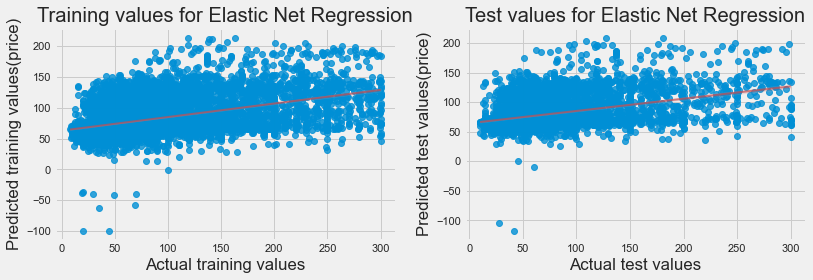

In [158]:
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
sns.regplot(y_train, elastic.predict(X_train), line_kws={"color":"r","alpha":0.7,"lw":2})
plt.xlabel('Actual training values')
plt.ylabel('Predicted training values(price)')
plt.title('Training values for Elastic Net Regression')
plt.subplot(2,2,2)
sns.regplot(y_test, elastic.predict(X_test), line_kws={"color":"r","alpha":0.7,"lw":2})
plt.xlabel('Actual test values')
plt.ylabel('Predicted test values(price)')
plt.title('Test values for Elastic Net Regression')
plt.savefig('Elastic.png')
plt.show()

In [159]:
# Since, from the above linear models which we have trained the data on, did not perform well,
# which comprised of lower accuracy scores and R2 scores on training and testing set,
# we tried to move to non Linear models and check if they perform better than
# what was achieved from the comprising Linear models.

In [160]:
# Random Forest Regressor

# Since the output of the linear model like Linear and Elastic Regression performed not so well on the training
# and test data that we had (It had a negative R2_score),
# We decided to use Random Forest ensemble method which is a non linear model.
# In this, we used a Regressor, since our output contains a Regression task.
# It uses multiple decision trees and a technique called as bagging.
# This combines multiple decision trees in determining the final output,
# rather than relying on individual decision trees.

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [161]:
# Splitting data into train and test set

features = ['minimum_nights', 'number_of_reviews', 'calculated_host_listings_count',
            'host_identity_verified', 'instant_bookable',
            'availability_365', 'minimum_distance']
X = berlin_1[features]
y = berlin_1['price']

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [162]:
rfr = RandomForestRegressor(random_state=42)

In [163]:
# Here we set the parameter grid for selecting the best parameters using GridSearchCV for our RandomForestRegressor.
# It also contains cross validation within the Gridsearch on the dataset.
# This method is called hyperparameter tuning, where optimization is the key factor for selecting the best parameters.

In [164]:
param_grid = { 
    'n_estimators': [500, 700, 1000],
    'max_features': ['auto'],
    'max_depth' : [8, 10, 12],
    'min_samples_split': [5],
    'bootstrap': [True]
}

In [165]:
# We used GridSearchCV for optimal hyperparameters

CV_rfc = GridSearchCV(estimator=rfr, param_grid=param_grid, cv= 5)
CV_rfc.fit(X_train, np.ravel(y_train))

C:\Users\Alper\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.

C:\Users\Alper\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.

C:\Users\Alper\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors a

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
             param_grid={'bootstrap': [True], 'max_depth': [8, 10, 12],
                         'max_features': ['auto'], 'min_samples_split': [5],
                         'n_estimators': [500, 700, 1000]})

In [166]:
CV_rfc.best_params_

{'bootstrap': True,
 'max_depth': 12,
 'max_features': 'auto',
 'min_samples_split': 5,
 'n_estimators': 1000}

In [167]:
# We used RFR with the best parameters obtained from GridSearchCV

rfc1=RandomForestRegressor(max_features='auto', n_estimators= 500, max_depth=12, min_samples_split=5, min_samples_leaf=2, bootstrap=True, oob_score=True, random_state=42)

In [168]:
# Training the RFR model

rfc1.fit(X_train, np.ravel(y_train))

C:\Users\Alper\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:416: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.



RandomForestRegressor(max_depth=12, max_features='auto', min_samples_leaf=2,
                      min_samples_split=5, n_estimators=500, oob_score=True,
                      random_state=42)

In [169]:
# We detected the Out of Bag score to estimate how much accurate our test prediction would be.

rfc1.oob_score_

0.39136710490554094

In [170]:
# Predicting the training and testing sets

y_pred = rfc1.predict(X_train)
y_test_pred = rfc1.predict(X_test)

In [171]:
from sklearn.metrics import r2_score, mean_squared_error


In [172]:
print(f"Training RMSE: {np.sqrt(mean_squared_error(y_train, y_pred))}")
print(f"Train R2 score: {r2_score(y_train, y_pred)}")

print(f"Testing RMSE: {np.sqrt(mean_squared_error(y_test, y_test_pred))}")
print(f"Test R2 score: {r2_score(y_test, y_test_pred)}")

Training RMSE: 35.340685314597934
Train R2 score: 0.6272411636951449
Testing RMSE: 45.255044703515416
Test R2 score: 0.34696627877086894


In [173]:
# From the above scores, we saw that the training score is almost 63% which the model fits very well on seen data.
# Our testing score is around 34% which does not do a pretty decent job on unseen data.
# And still there was some room for improvement like selecting some more features(feature engineering),
# tweaking a few parameters to obtain some more best results(even though not likely everytime it succeeds).

In [174]:
# we did feature importance here.
rfc1.feature_importances_

array([0.11624835, 0.11127624, 0.12885337, 0.00826425, 0.01347061,
       0.40168029, 0.22020689])

In [175]:
# we extracted the numerical values of feature importance from the Random Forest Regressor
importances = rfc1.feature_importances_

# created a feature list from the original dataset (list of columns)
feature_list = list(X.columns)

# created a list of tuples
feature_importance= sorted(zip(importances, feature_list), reverse=True)

# created two lists from the previous list of tuples
df = pd.DataFrame(feature_importance, columns=['importance', 'feature'])
importance= list(df['importance'])
feature= list(df['feature'])

#see df
print(df)

   importance                         feature
0    0.401680                availability_365
1    0.220207                minimum_distance
2    0.128853  calculated_host_listings_count
3    0.116248                  minimum_nights
4    0.111276               number_of_reviews
5    0.013471                instant_bookable
6    0.008264          host_identity_verified


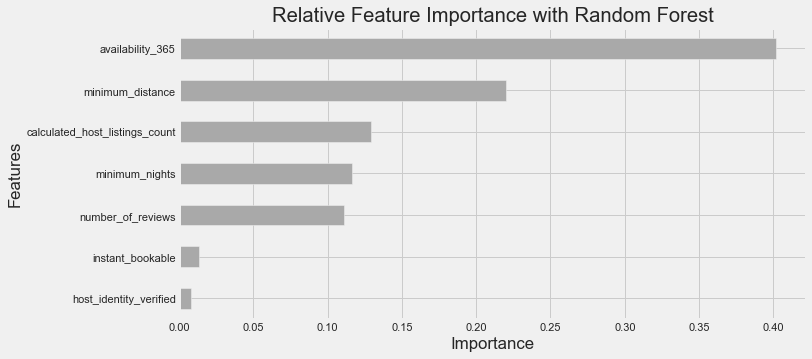

In [176]:
# we plotted the important features
feat_importances = pd.Series(rfc1.feature_importances_, index=X.columns)
feat_importances.nlargest(15).sort_values().plot(kind='barh', color='darkgrey', figsize=(10,5))
plt.title('Relative Feature Importance with Random Forest')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.savefig("importance.png")

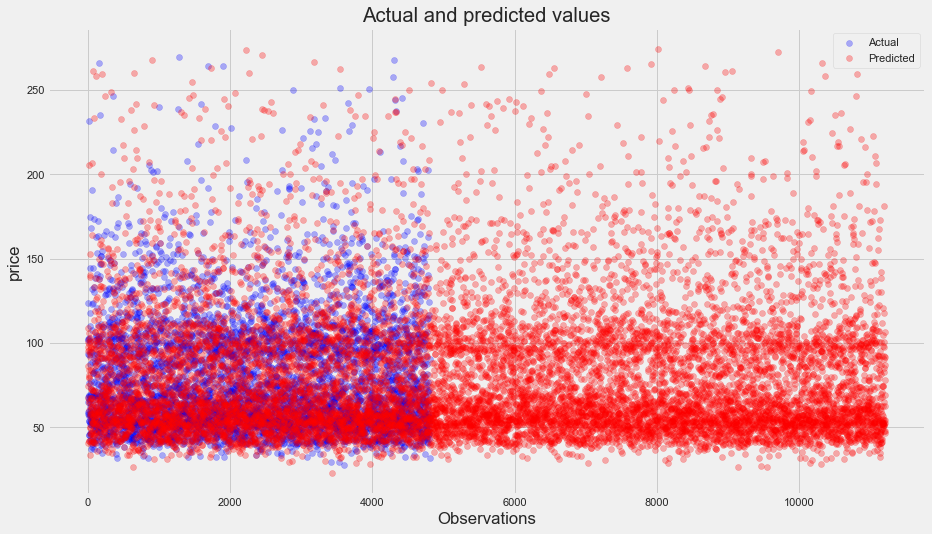

In [177]:
import matplotlib.pyplot as plt
_, ax = plt.subplots(figsize=(14, 8))

ax.scatter(x = range(0, y_test_pred.size), y=y_test_pred, c = 'blue', label = 'Actual', alpha = 0.3)
ax.scatter(x = range(0, y_pred.size), y=y_pred, c = 'red', label = 'Predicted', alpha = 0.3)

plt.title('Actual and predicted values')
plt.xlabel('Observations')
plt.ylabel('price')
plt.legend()
plt.savefig("actual_and_pred.png")
plt.show()

In [178]:
#Scatter plot of actual vs predicted output above.
# It can be seen from the plot that our model did a pretty good job
# in detecting the output of the price with regards to the features included in our model.

C:\Users\Alper\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\Alper\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



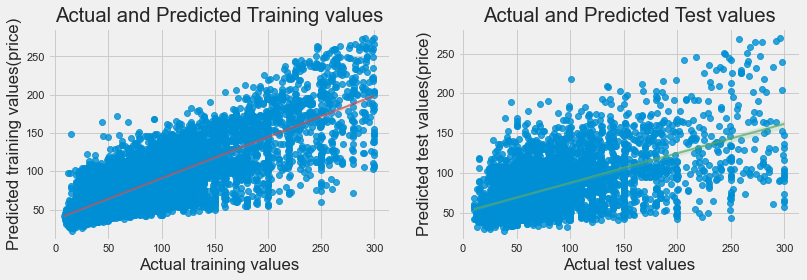

In [179]:
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
sns.regplot(y_train, y_pred, line_kws={"color":"r","alpha":0.7,"lw":2})
plt.xlabel('Actual training values')
plt.ylabel('Predicted training values(price)')
plt.title('Actual and Predicted Training values')
plt.subplot(2,2,2)
sns.regplot(y_test, y_test_pred,  line_kws={"color":"g","alpha":0.7,"lw":2})
plt.xlabel('Actual test values')
plt.ylabel('Predicted test values(price)')
plt.title('Actual and Predicted Test values')
plt.show()

In [180]:
# One hot encoding for future models.
transformed_df = pd.get_dummies(berlin_1)
transformed_df.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,instant_bookable,...,neighbourhood_Wiesbadener Straße,neighbourhood_Wilhelmstadt,neighbourhood_Zehlendorf Nord,neighbourhood_Zehlendorf Südwest,neighbourhood_nördliche Luisenstadt,neighbourhood_südliche Luisenstadt,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,52.357652,13.399098,88,1,0,0.00,1,6,0,1,...,0,0,0,0,0,0,1,0,0,0
1,52.520060,13.659560,60,2,126,2.54,2,163,18,0,...,0,0,0,0,0,0,1,0,0,0
2,52.412320,13.207150,36,8,29,0.63,1,6,6,1,...,0,0,0,1,0,0,1,0,0,0
3,52.402144,13.273865,120,1,0,0.00,1,257,0,0,...,0,0,0,0,0,0,1,0,0,0
4,52.410150,13.292070,110,5,1,0.03,8,160,0,0,...,0,0,0,0,0,0,1,0,0,0


In [181]:
# A function for multi collinearity heatmap

def multi_collinearity_heatmap(df, figsize=(11,9)):
    
    """
    Creates a heatmap of correlations between features in the df. A figure size can optionally be set.
    """
    
    # Set the style of the visualization
    sns.set(style="white")

    # Create a covariance matrix
    corr = df.corr()

    # Generate a mask the size of our covariance matrix
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=figsize)

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, vmax=corr[corr != 1.0].max().max());

C:\Users\Alper\AppData\Local\Temp\ipykernel_1512\2448879120.py:16: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



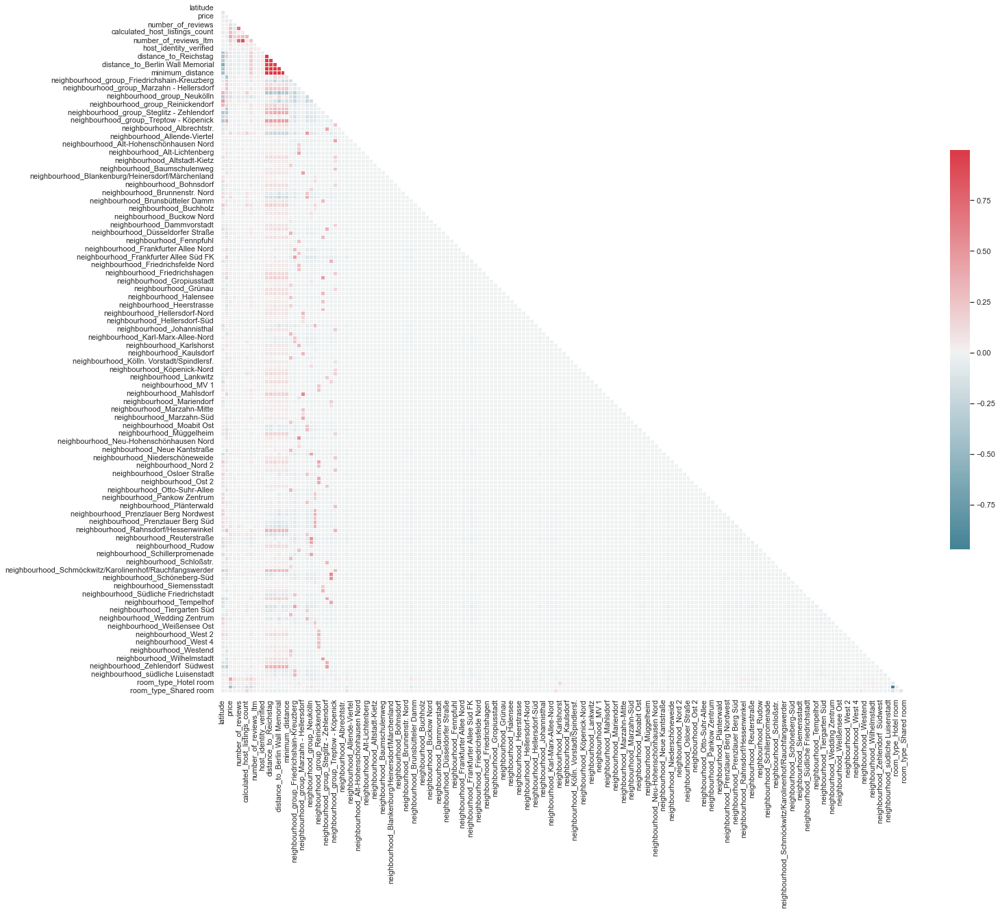

In [182]:
multi_collinearity_heatmap(transformed_df, figsize=(20,20))

In [183]:
# It didn't look like there were any significant collinear relationships with neighbourhood variables,
# so these was temporarily be dropped to produce a clearer heatmap for the remaining features:

C:\Users\Alper\AppData\Local\Temp\ipykernel_1512\2448879120.py:16: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



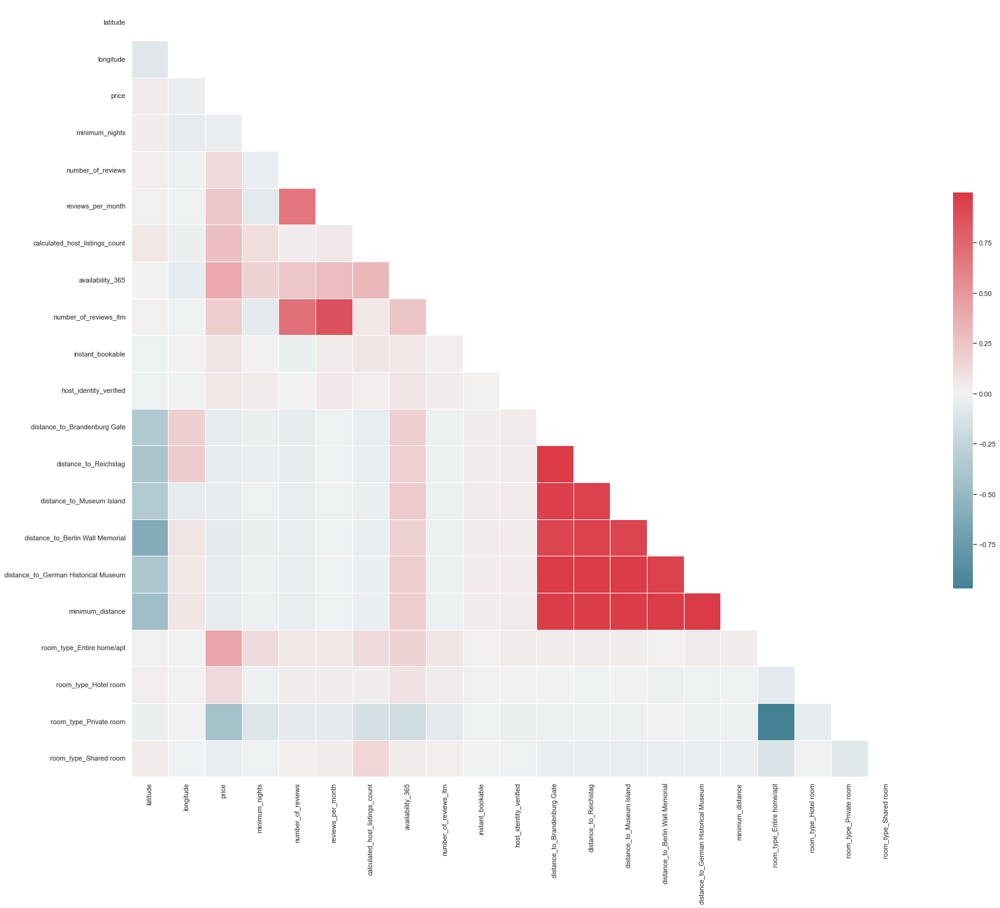

In [184]:
multi_collinearity_heatmap(transformed_df.drop(list(transformed_df.columns[transformed_df.columns.str.startswith('neighbourhood')]), axis=1), figsize=(25,22))

In [185]:
# We also dropped distance related features because of multi collinearity.

to_drop = ['distance_to_Reichstag', 'distance_to_Brandenburg Gate', 'minimum_distance', 
           'distance_to_Museum Island', 'distance_to_Berlin Wall Memorial',
           'distance_to_German Historical Museum',]
to_drop.extend(list(transformed_df.columns[transformed_df.columns.str.endswith('nan')]))


In [186]:
transformed_df.drop(to_drop, axis=1, inplace=True)

C:\Users\Alper\AppData\Local\Temp\ipykernel_1512\2448879120.py:16: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



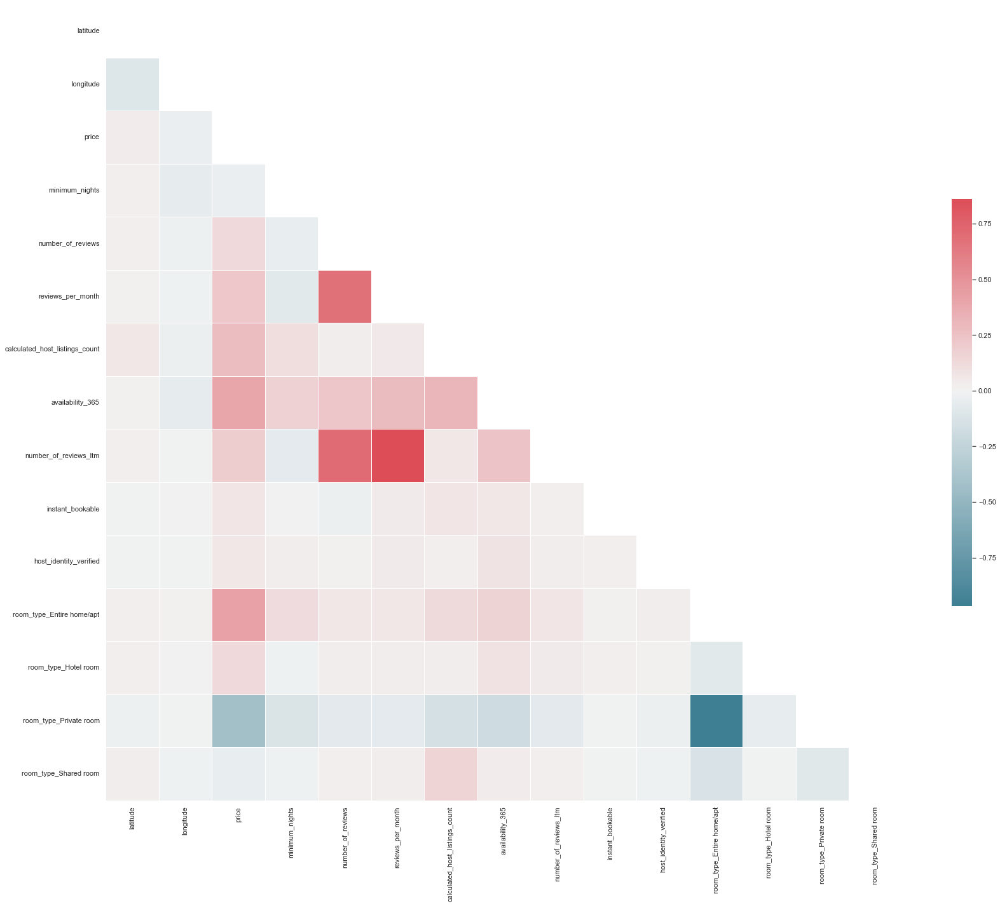

In [187]:
# Final assesment of multi collinearity:
multi_collinearity_heatmap(transformed_df.drop(list(transformed_df.columns[transformed_df.columns.str.startswith('neighbourhood')]), axis=1), figsize=(25,22))

In [188]:
# There were still some fairly strong correlations between highly rated properties of different reviews categories
# However, these would be left in for now and can be experimented with later to see if removing them improves the model.

In [189]:
# Separating X and y
X = transformed_df.drop('price', axis=1)
y = transformed_df.price

# Scaling
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))

In [190]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

In [191]:
# Another Model: Gradient boosted decision trees

xgb_reg = xgb.XGBRegressor()
xgb_reg.fit(X_train, y_train)
training_preds_xgb_reg = xgb_reg.predict(X_train)
val_preds_xgb_reg = xgb_reg.predict(X_test)
print("\nTraining r2:", round(r2_score(y_train, training_preds_xgb_reg),4))
print("Validation r2:", round(r2_score(y_test, val_preds_xgb_reg),4))


Training r2: 0.7652
Validation r2: 0.5303


In [192]:
# With XGBoost, our features explain approximately 76% of the variance in our target variable.